In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns',None)

In [3]:
df = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [4]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [5]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,2,Male,82,4,2,Laboratory Technician,3,Married,4404,10228,2,Y,No,12,3,1,80,0,6,3,4,4,3,1,2


In [6]:
df.shape

(1470, 35)

In [7]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


#### "Education", "EnvironmentSatisfaction", "JobInvolvement", "JobLevel", "JobSatisfaction", "PerformanceRating", "RelationshipSatisfaction", "StockOptionLevel", and "WorkLifeBalance" columns contain categorical data.
#### "Age", "DailyRate", "DistanceFromHome", "EmployeeNumber", "HourlyRate", "MonthlyIncome", "MonthlyRate", "NumCompaniesWorked", "PercentSalaryHike", "TotalWorkingYears", "TrainingTimesLastYear", "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", and "YearsWithCurrManager" columns likely contain numerical data.

In [8]:
numaric_column = ["Age", "DailyRate", "DistanceFromHome", 
                  "HourlyRate", "MonthlyIncome", 
                  "MonthlyRate", "NumCompaniesWorked", "PercentSalaryHike", 
                  "TotalWorkingYears", "TrainingTimesLastYear", "YearsAtCompany", 
                  "YearsInCurrentRole", "YearsSinceLastPromotion","YearsWithCurrManager"]

# Data Cleaning

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [10]:
# categoricale column
# ["Attrition", "BusinessTravel", "Department", "EducationField", "Gender", "JobRole", "MaritalStatus", "Over18", "OverTime",]

In [11]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

#### Data not Contain any Null values

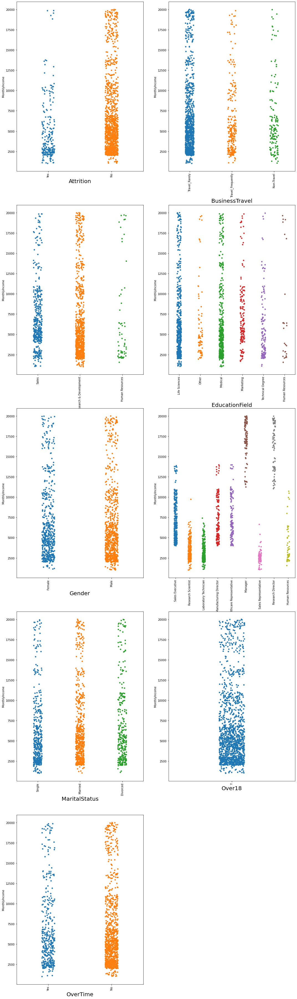

In [12]:
plt.figure(figsize=(18,200))
plotnumber = 1
for i in df:
    if df[i].dtype == "int64":
        pass
    else:
        if plotnumber<=30:
        
            ax = plt.subplot(15,2,plotnumber)
            sns.stripplot(x=df[i],y=df['MonthlyIncome'])
            plt.xlabel(i,fontsize=20)
            plt.xticks(rotation=90)
        plotnumber += 1
    
plt.show()

In [13]:
encoded_cat_column=["Education", "EnvironmentSatisfaction", "JobInvolvement", "JobLevel", "JobSatisfaction", "PerformanceRating", "RelationshipSatisfaction", "StockOptionLevel","WorkLifeBalance"]

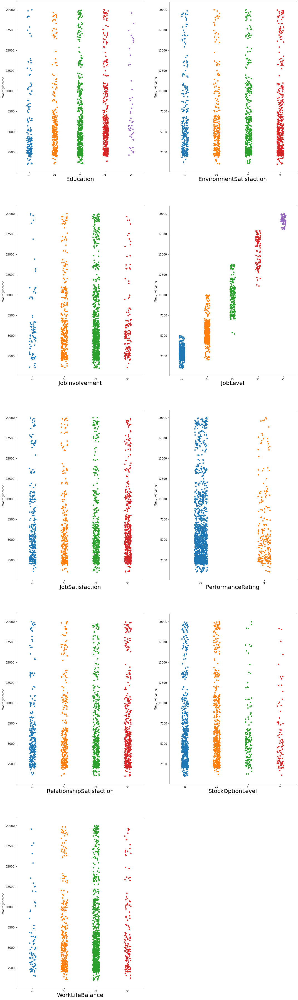

In [14]:
plt.figure(figsize=(18,200))
plotnumber = 1
for i in encoded_cat_column:
    if plotnumber<=30:
        
        ax = plt.subplot(15,2,plotnumber)
        sns.stripplot(x=df[i],y=df['MonthlyIncome'])
        plt.xlabel(i,fontsize=20)
        plt.xticks(rotation=90)
    plotnumber += 1
    
plt.show()

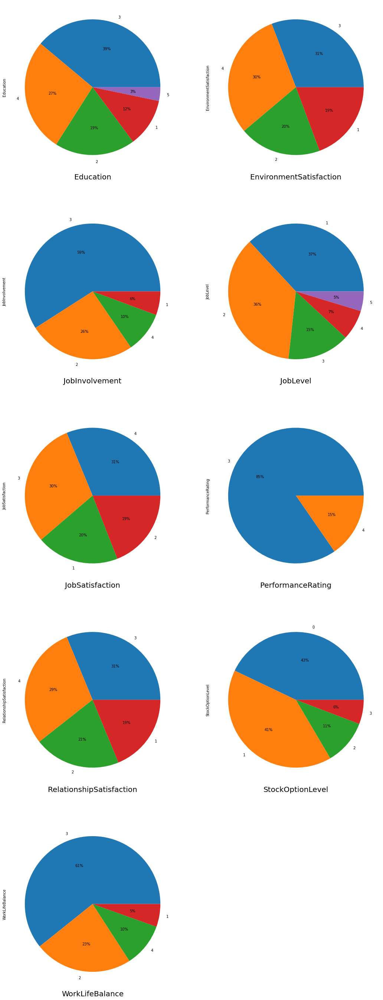

In [15]:
plt.figure(figsize=(18,150))
plotnumber = 1
for i in encoded_cat_column:
    if plotnumber<=30:
        
        ax = plt.subplot(15,2,plotnumber)
        df[i].value_counts().plot(kind='pie',autopct='%.0f%%')
        plt.xlabel(i,fontsize=20)
        
    plotnumber += 1
    
plt.show()

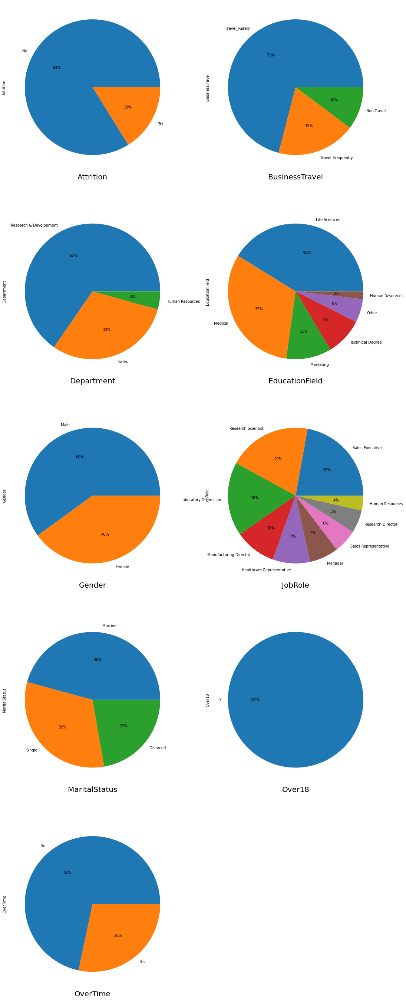

In [16]:
plt.figure(figsize=(18,150))
plotnumber = 1
for i in df:
    if df[i].dtype == "int64":
        pass
    else:
        if plotnumber<=30:
        
            ax = plt.subplot(15,2,plotnumber)
            df[i].value_counts().plot(kind="pie",autopct='%.0f%%')
            plt.xlabel(i,fontsize=20)
        plotnumber += 1
    
plt.show()

### Obesrvation Pie Plot
1. Attrition is targert variable and 84% is not resigned or terminated from organization that mean data is considerd as imbalance data.
2. 65% of employee are from reaserch and development and 30% form sales department
3. More than 70% of Medical and Life science educationfield.
4. There 40% of Female employee and 60% of male.
5. Out of all the employees, 22% are sales executives, 20% are research scientists, and 18% are laboratory technicians.
6. Out of all the employees, 46% are married, 32% are single, and the rest are divorced.

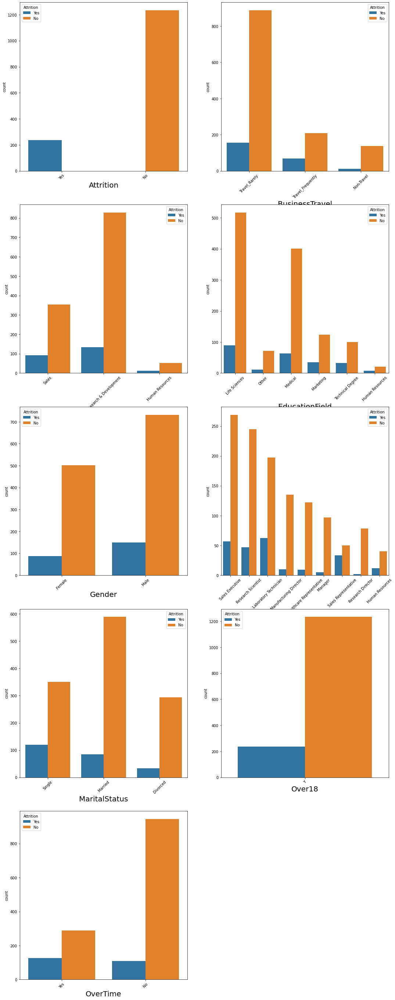

In [17]:
plt.figure(figsize=(18,150))
plotnumber = 1
for i in df:
    if df[i].dtype == "int64":
        pass
    else:
        if plotnumber<=30:
        
            ax = plt.subplot(15,2,plotnumber)
            sns.countplot(df[i],hue="Attrition",data=df)
            plt.xlabel(i,fontsize=20)
            plt.xticks(rotation=45)
        plotnumber += 1
    
plt.show()

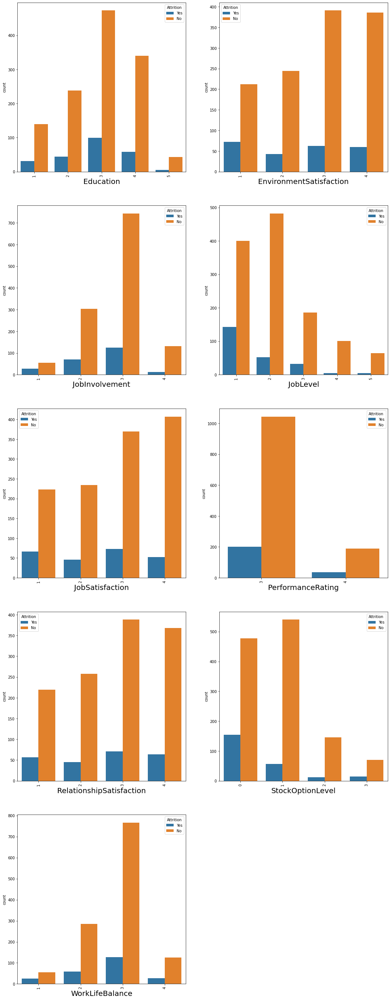

In [18]:
plt.figure(figsize=(18,150))
plotnumber = 1
for i in encoded_cat_column:
    if plotnumber<=30:
        
        ax = plt.subplot(15,2,plotnumber)
        sns.countplot(df[i],hue="Attrition",data=df)
        plt.xlabel(i,fontsize=20)
        plt.xticks(rotation=90)
    plotnumber += 1
    
plt.show()

In [19]:
pd.crosstab([df.Education],[df.Department], margins=True)

Department,Human Resources,Research & Development,Sales,All
Education,,,,
1,5,115,50,170
2,13,182,87,282
3,27,379,166,572
4,15,255,128,398
5,3,30,15,48
All,63,961,446,1470


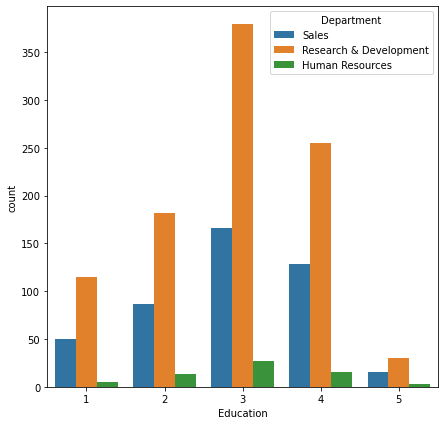

In [20]:
plt.figure(figsize=(7,7))
sns.countplot(df["Education"],hue=df["Department"],data=df)
plt.show()

In [21]:
pd.crosstab([df.EducationField],[df.JobRole], margins=True)

JobRole,Healthcare Representative,Human Resources,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,All
EducationField,,,,,,,,,,
Human Resources,0,21,0,6,0,0,0,0,0,27
Life Sciences,60,13,119,40,71,36,133,107,27,606
Marketing,0,0,0,14,0,0,0,122,23,159
Medical,48,11,99,32,53,35,103,65,18,464
Other,9,3,22,5,7,4,17,13,2,82
Technical Degree,14,4,19,5,14,5,39,19,13,132
All,131,52,259,102,145,80,292,326,83,1470


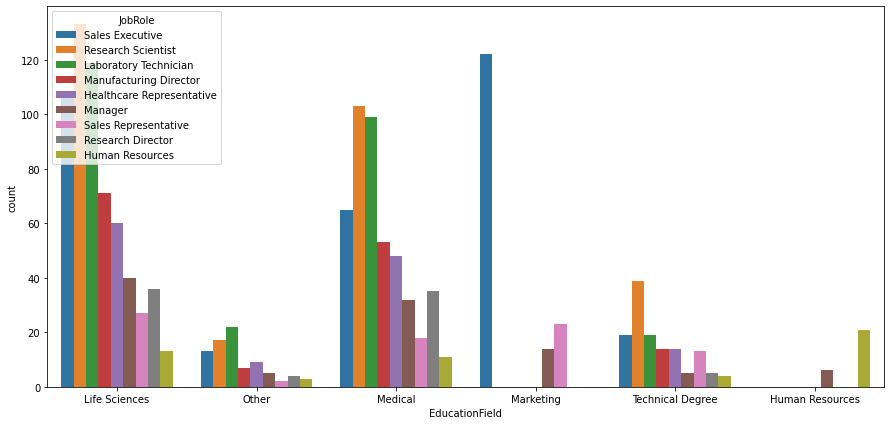

In [22]:
plt.figure(figsize=(15,7))
sns.countplot(df["EducationField"],hue=df["JobRole"],data=df)
plt.show()

In [23]:
pd.crosstab([df.JobRole],[df.Department], margins=True)

Department,Human Resources,Research & Development,Sales,All
JobRole,,,,
Healthcare Representative,0,131,0,131
Human Resources,52,0,0,52
Laboratory Technician,0,259,0,259
Manager,11,54,37,102
Manufacturing Director,0,145,0,145
Research Director,0,80,0,80
Research Scientist,0,292,0,292
Sales Executive,0,0,326,326
Sales Representative,0,0,83,83


In [24]:
pd.crosstab([df.JobLevel],[df.JobRole], margins=True)

JobRole,Healthcare Representative,Human Resources,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,All
JobLevel,,,,,,,,,,
1,0,33,200,0,0,0,234,0,76,543
2,78,13,56,0,90,0,57,233,7,534
3,44,6,3,12,45,28,1,79,0,218
4,9,0,0,47,10,26,0,14,0,106
5,0,0,0,43,0,26,0,0,0,69
All,131,52,259,102,145,80,292,326,83,1470


In [25]:
def scatter_pot(y_value):
    plt.figure(figsize=(40,120))
    plotnumber = 1
    for i in numaric_column:
        
        if plotnumber<=30:
            ax = plt.subplot(8,4,plotnumber)
            sns.scatterplot(x=df[i],y=df[y_value],hue=df['Attrition'])
            plt.xlabel(i,fontsize=20)
        plotnumber += 1
    
    plt.show()
    print('***'*25)

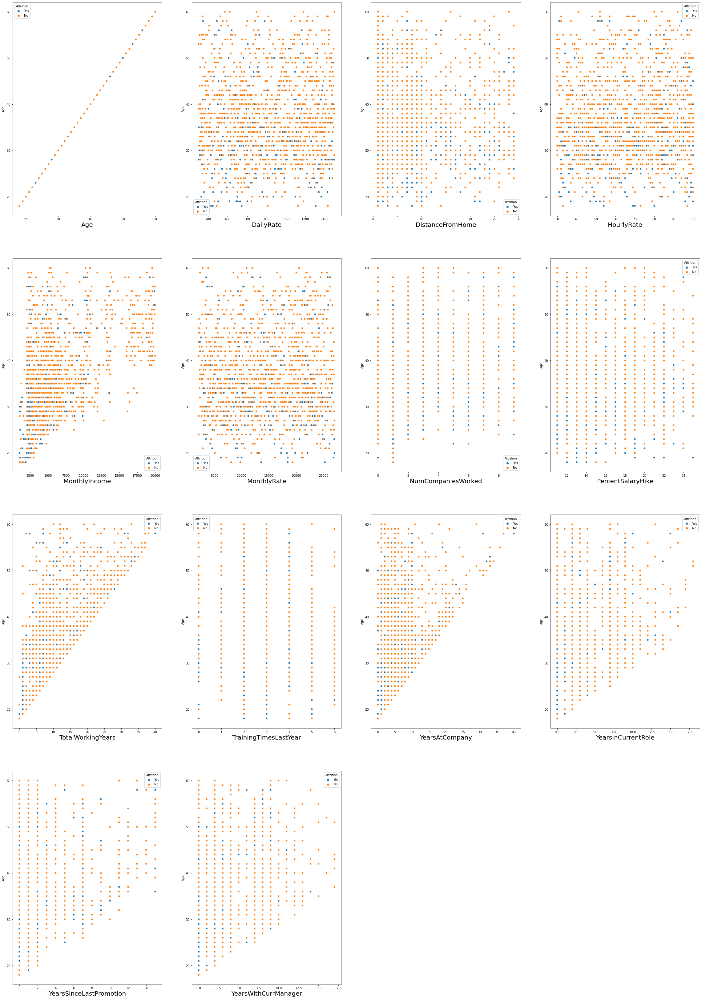

***************************************************************************


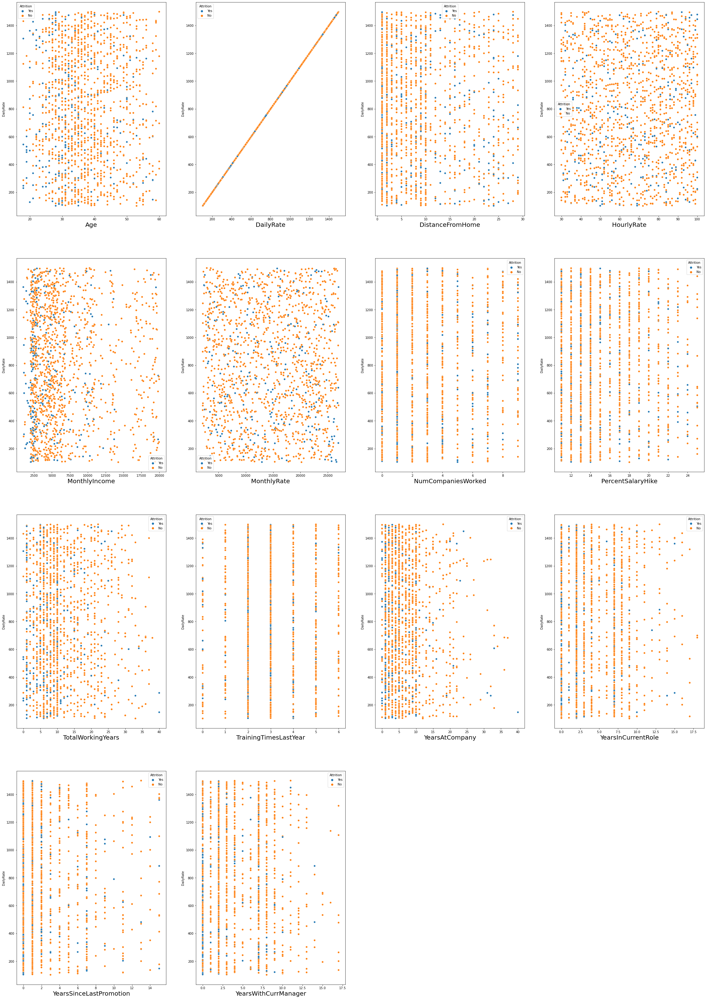

***************************************************************************


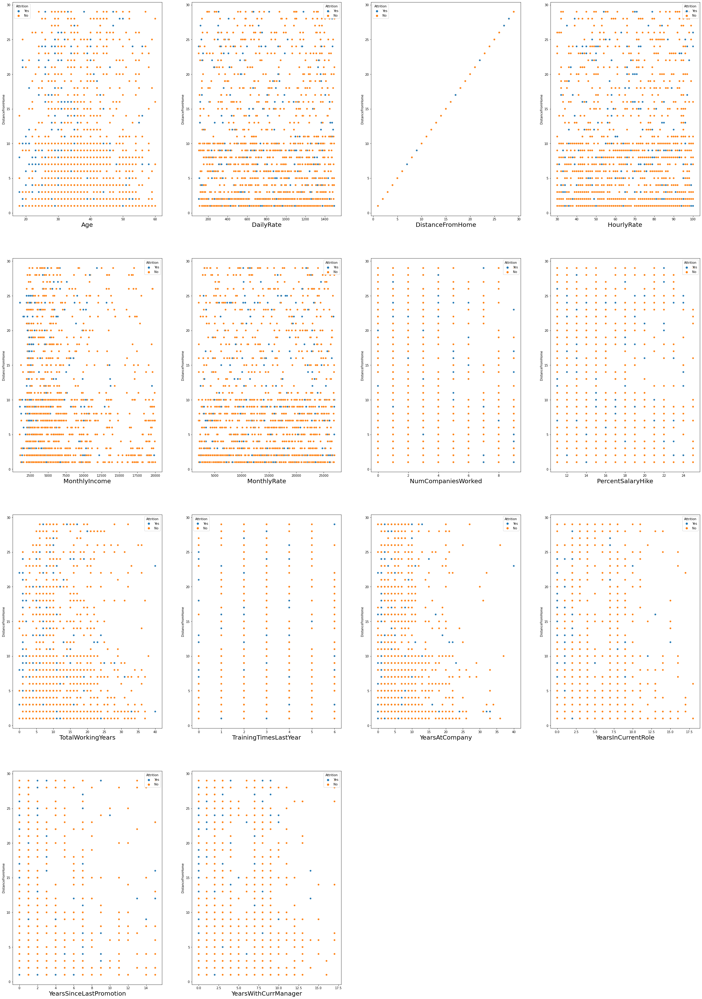

***************************************************************************


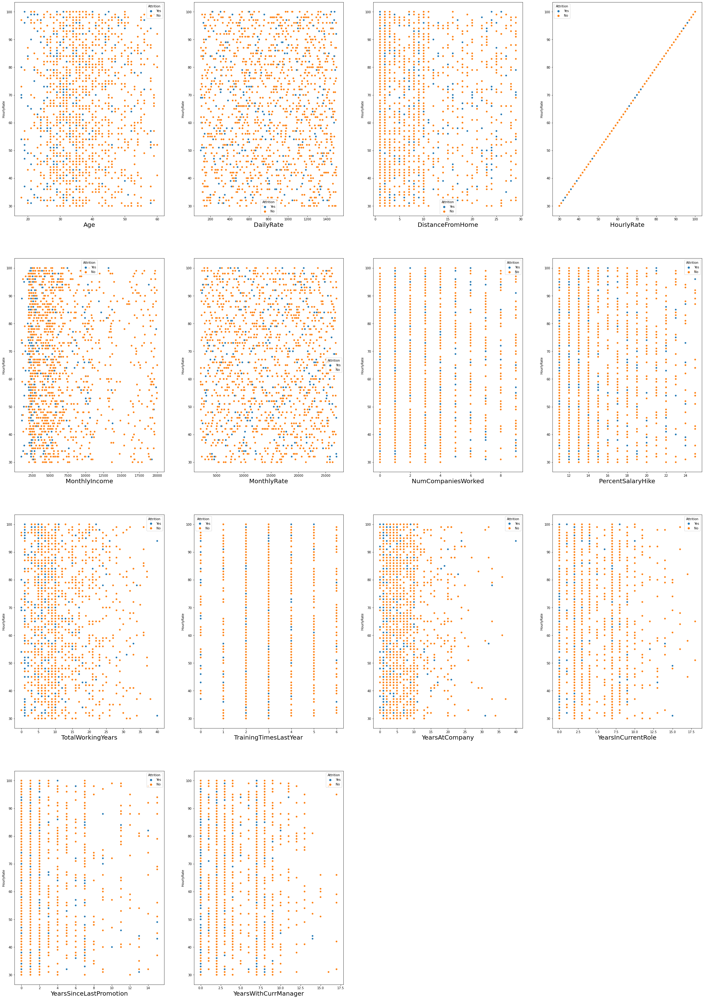

***************************************************************************


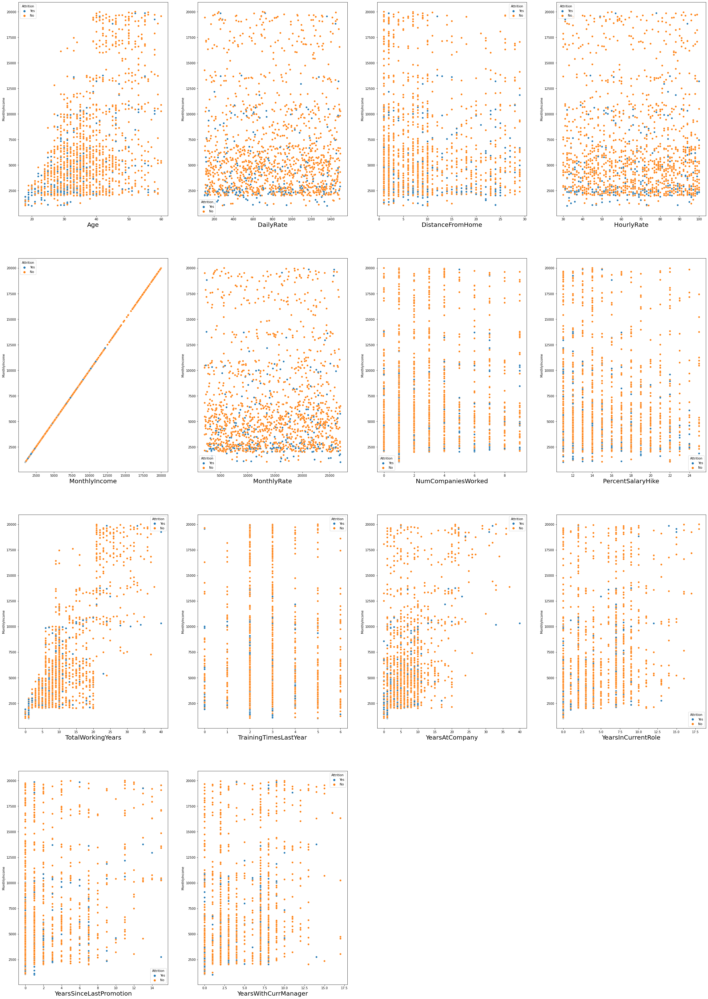

***************************************************************************


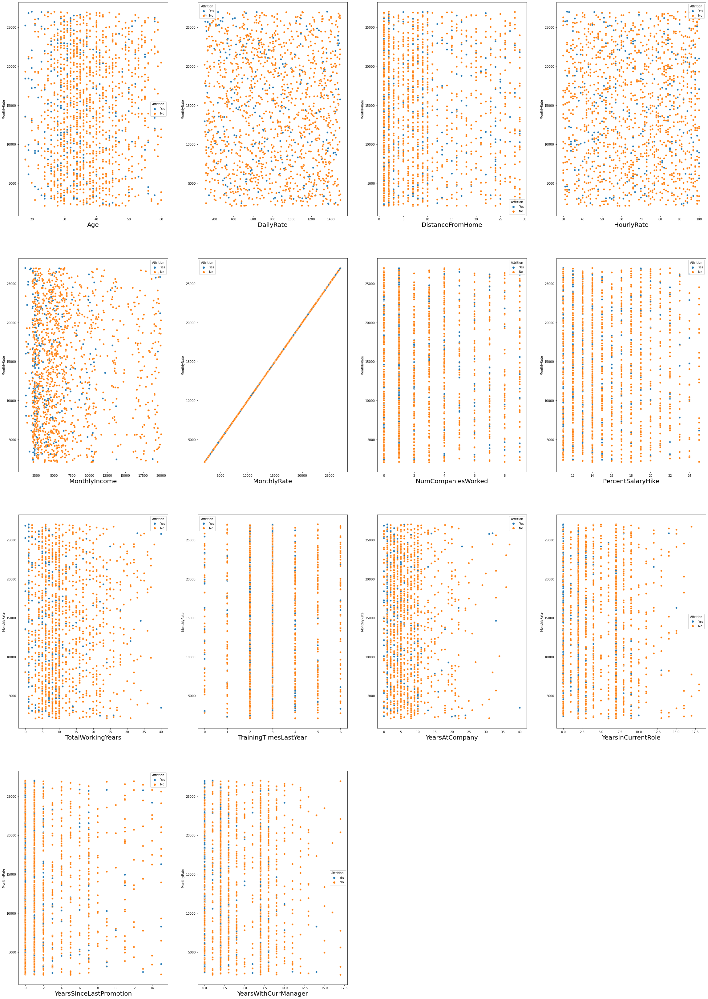

***************************************************************************


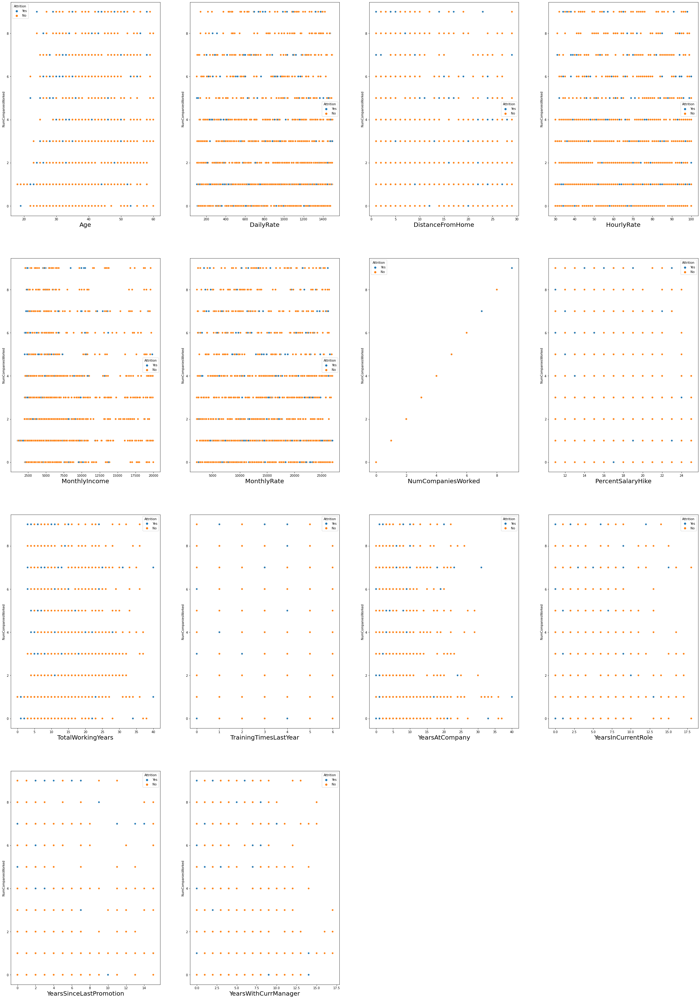

***************************************************************************


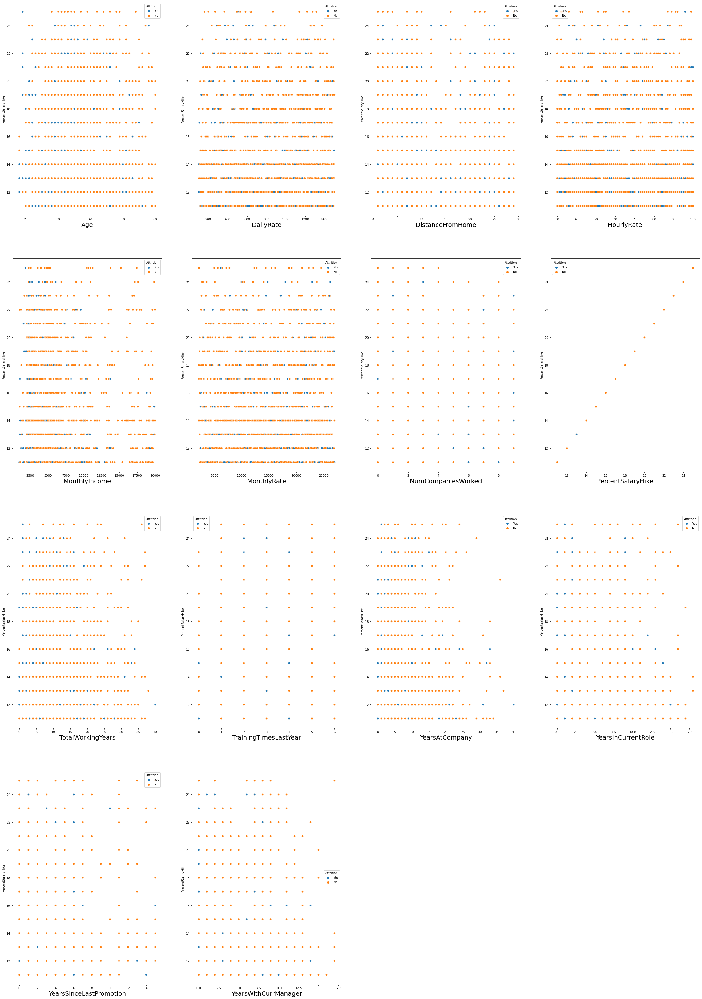

***************************************************************************


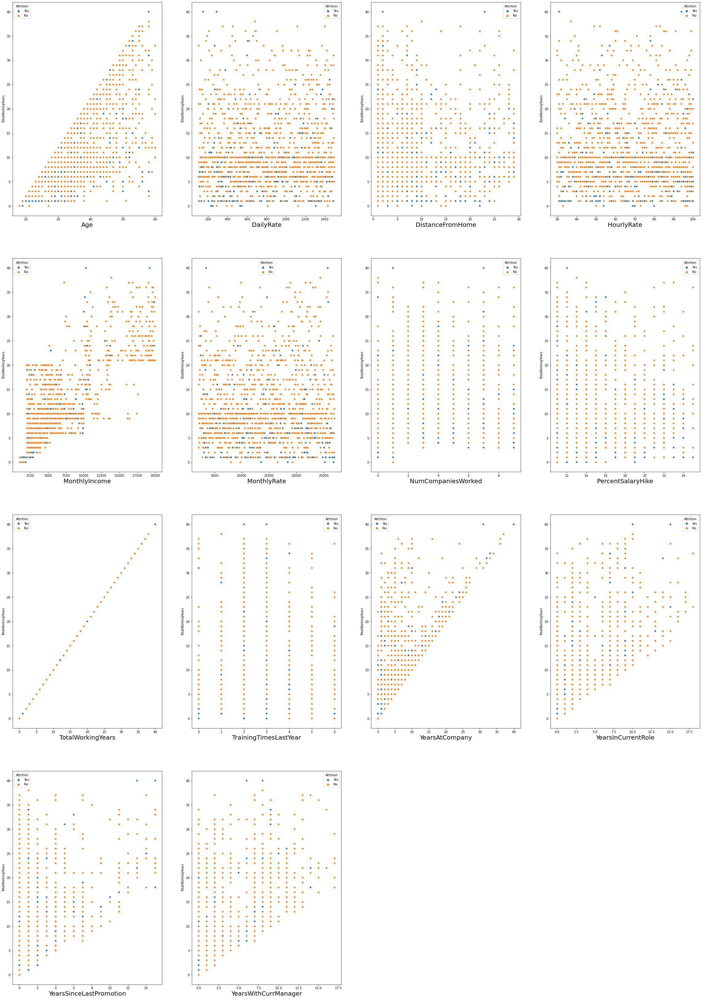

***************************************************************************


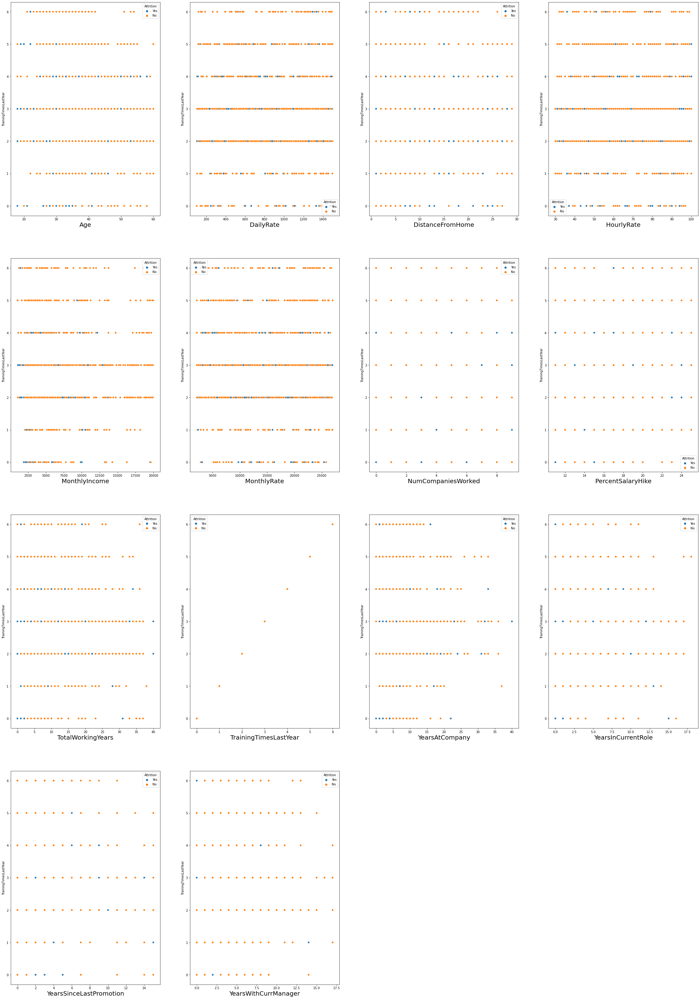

***************************************************************************


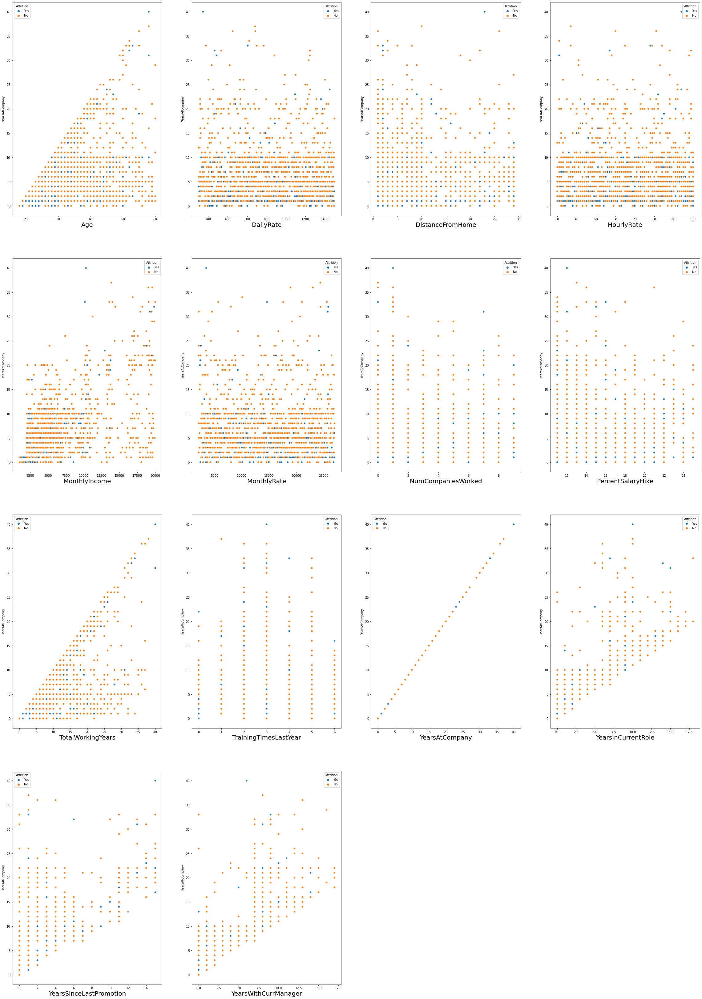

***************************************************************************


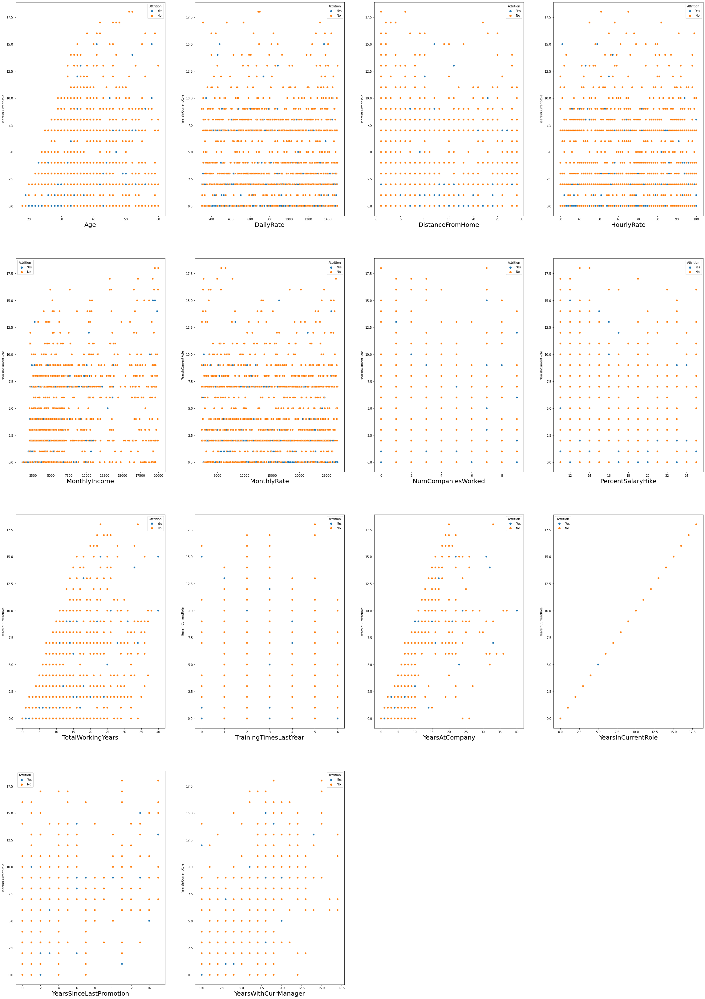

***************************************************************************


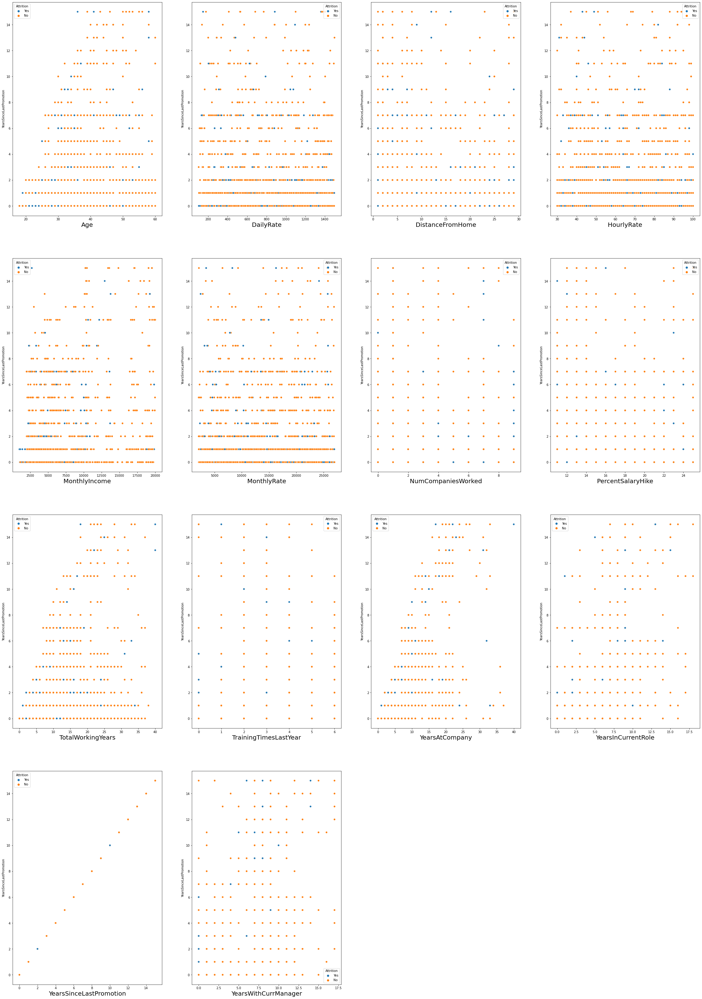

***************************************************************************


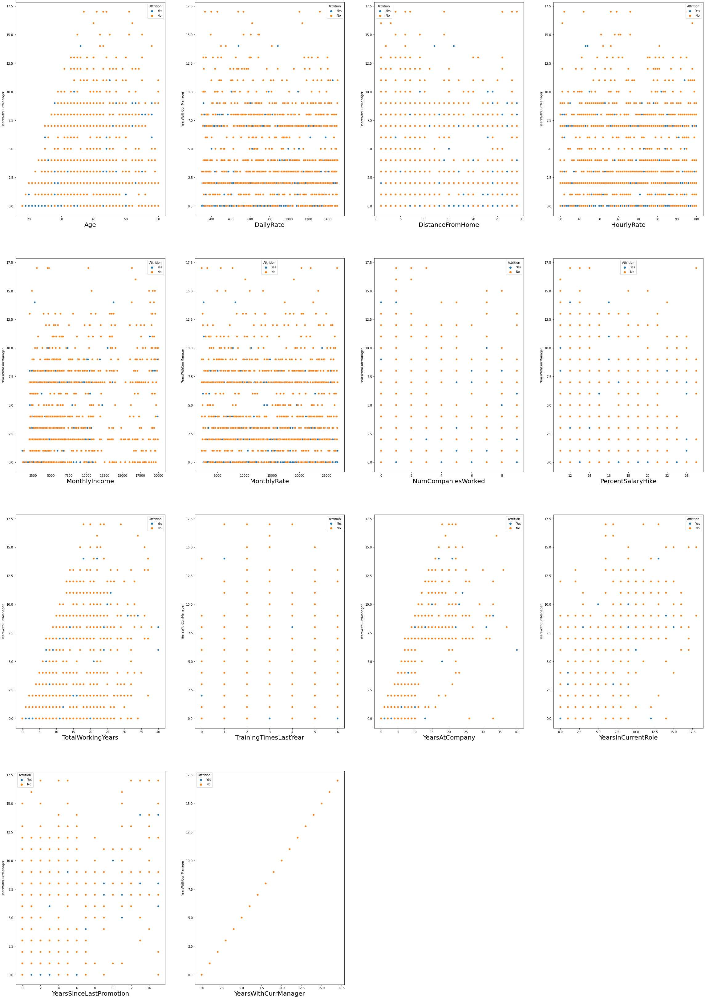

***************************************************************************


In [26]:
for i in numaric_column:
    if df[i].dtype == "object":
        pass
    else:
        scatter_pot(i)

### Observation on ScatterPlot
 1. joblevel and MonthlyIncome have positive relationship with age.
 2. TotalWorkingYears and YearsatCompany have positive relationship with age.
 3. YearsinCurrentRole, YearsinceLastPromotion and YearwithcuurrManager also have positive relation
 4. As jobLevel increases, there is a corresponding increase in MonthlyIncome, indicating a positive relationship between the two.
 5. there is Positive relationship between TotalWorkingYear and MonthlyIncome.
 6. PercentSalaryHike and PerformanceRating have positive relation 
 7. If someone's rating is 3, their salary increase is less than 20 percent, whereas if their rating is 4, their salary increase is more than 20 percent.
 8. There is a positive relationship between TotalWorkingYears and YearsAtCompany, as the more years an individual works at a company, the higher their total working years.
 9. There is a positive relationship between totalWorkingYears and YearsinCurrentRole, as the longer someone has been in their current role, the more it adds to their total working years.

## Encoding 

In [27]:
 from sklearn.preprocessing import LabelEncoder

In [28]:
le = LabelEncoder()

In [29]:
for i in df:
    if df[i].dtype == object:
         df[i] = le.fit_transform(df[i].values.reshape(-1,1))

In [30]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,1,2,0,94,3,2,7,4,2,5993,19479,8,0,1,11,3,1,80,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,1,2,3,1,61,2,2,6,2,1,5130,24907,1,0,0,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,1,4,4,1,92,2,1,2,3,2,2090,2396,6,0,1,15,3,2,80,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,1,5,4,0,56,3,1,6,3,1,2909,23159,1,0,1,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,7,1,1,40,3,1,2,2,1,3468,16632,9,0,0,12,3,4,80,1,6,3,3,2,2,2,2


In [31]:
df.shape

(1470, 35)

### Removing outlier

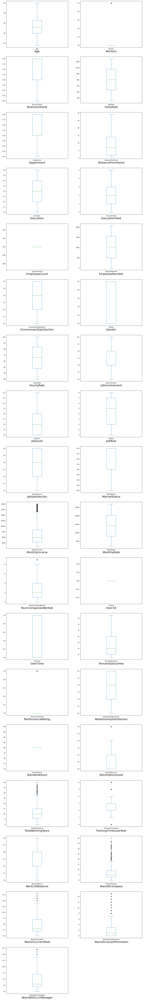

In [32]:
plt.figure(figsize=(18,150))
plotnumber = 1
for i in df:
    if df[i].dtype == "object":
        pass
    else:
        if plotnumber<=40:
        
            ax = plt.subplot(20,2,plotnumber)
            df[i].plot(kind = 'box')
            plt.xlabel(i,fontsize=20)
        plotnumber += 1
    
plt.show()

In [33]:
outlier_column = ['MonthlyIncome','TotalWorkingYears','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']

In [34]:
from scipy.stats import zscore

abs_zscore = np.abs(zscore(df[outlier_column]))
threshold = 3
df1 = df[(abs_zscore<threshold).all(axis = 1)]

print ("Shape of the dataframe before removing outliers: ", df.shape)
print ("Shape of the dataframe after removing outliers: ", df1.shape)
print ("Percentage of data loss after outlier removal: ", (df.shape[0]-df1.shape[0])/df.shape[0]*100)


Shape of the dataframe before removing outliers:  (1470, 35)
Shape of the dataframe after removing outliers:  (1387, 35)
Percentage of data loss after outlier removal:  5.646258503401361


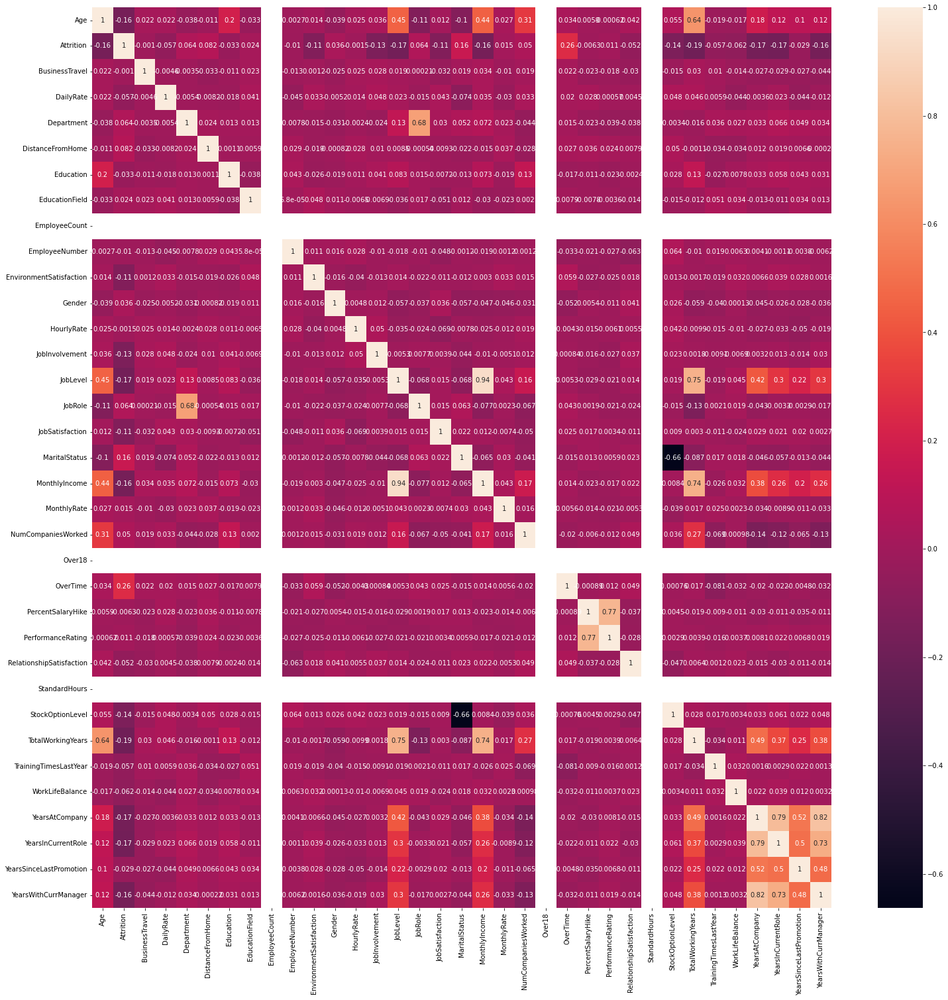

In [35]:
plt.figure(figsize=(25,25))
sns.heatmap(df1.corr(),annot=True)
plt.show()

In [36]:
x = df1.drop(columns=['Attrition'])
y = df1['Attrition']

In [37]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [38]:
x_scaled = scaler.fit_transform(x)

In [39]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [40]:
vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x_scaled,i) for i in range(x_scaled.shape[1])]
vif["Features"] = x.columns

In [41]:
vif.sort_values('vif',ascending=False)

,vif,Features
13,10.189305,JobLevel
17,9.376742,MonthlyIncome
30,4.887193,YearsAtCompany
27,3.887997,TotalWorkingYears
33,3.325136,YearsWithCurrManager
31,2.984459,YearsInCurrentRole
22,2.479611,PercentSalaryHike
23,2.474168,PerformanceRating
3,2.062046,Department
14,1.978225,JobRole


In [42]:
df1.drop(columns=['EmployeeCount', 'StandardHours', 'Over18','EmployeeNumber'],inplace=True)

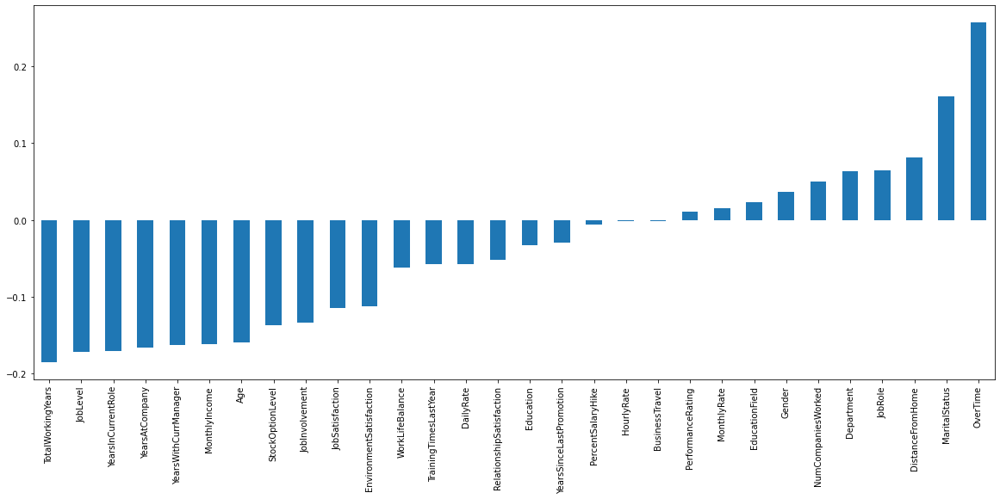

In [43]:
plt.figure(figsize=(20,8))
df1.corr()["Attrition"].sort_values().drop(["Attrition"]).plot(kind = "bar")
plt.show()

In [44]:
df1.corr()["Attrition"].sort_values().drop(["Attrition"])

TotalWorkingYears          -0.185619
JobLevel                   -0.171968
YearsInCurrentRole         -0.171015
YearsAtCompany             -0.166455
YearsWithCurrManager       -0.162297
MonthlyIncome              -0.161848
Age                        -0.159366
StockOptionLevel           -0.136676
JobInvolvement             -0.133957
JobSatisfaction            -0.114206
EnvironmentSatisfaction    -0.112393
WorkLifeBalance            -0.062492
TrainingTimesLastYear      -0.057285
DailyRate                  -0.057220
RelationshipSatisfaction   -0.052344
Education                  -0.032703
YearsSinceLastPromotion    -0.029263
PercentSalaryHike          -0.006267
HourlyRate                 -0.001532
BusinessTravel             -0.001041
PerformanceRating           0.010781
MonthlyRate                 0.014888
EducationField              0.023585
Gender                      0.036252
NumCompaniesWorked          0.050314
Department                  0.063637
JobRole                     0.064283
D

### Hourly rate, business travel and performance rating does not have any relation with target variable(attrition).

In [45]:
df1.drop(columns=['HourlyRate','BusinessTravel','PerformanceRating'],inplace=True)

## Feature Selection

In [46]:
from sklearn.feature_selection import SelectKBest, f_classif

In [47]:
from sklearn.decomposition import PCA
pca = PCA()

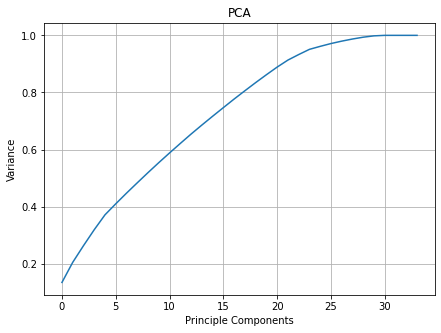

In [48]:
pca.fit_transform(x_scaled)
plt.figure(figsize=(7,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principle Components')
plt.ylabel('Variance')
plt.title('PCA')
plt.grid()

25 Principle componets are able to explain more than 95% of data

In [49]:
components = 25
pca = PCA(n_components=components)
comp_25 = pca.fit_transform(x_scaled)

In [50]:
principle_x = pd.DataFrame(comp_25,columns=np.arange(25))
principle_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,-0.056956,0.715960,-1.972086,-1.532301,0.367747,2.117710,-2.222888,1.055484,-0.598369,2.623733,-1.666266,-0.075817,-0.401199,0.305272,-1.638974,1.564844,0.568477,1.048812,0.959345,-0.430080,0.967404,1.507458,-0.672427,-0.741788,0.336381
1,0.951087,-1.002833,2.784167,-1.576970,0.099469,0.477695,0.703264,-1.138257,-0.604586,-0.954796,2.050301,0.294717,-1.641244,0.426496,-0.432804,1.863930,-0.641417,0.388148,-0.021947,-0.402745,-0.047623,0.451504,-1.519444,1.391995,0.209652
2,-2.510665,1.405936,-0.160357,-0.329215,-1.453752,1.780939,1.070391,1.512670,1.531072,-0.081023,-1.053327,-1.534332,0.465362,0.737541,-0.953992,-0.438043,0.361015,1.729715,-0.412642,-0.466737,-0.850774,1.531264,-0.059423,-0.129491,0.372385
3,-0.545813,-0.815292,-1.111604,0.206750,-0.514117,2.166847,-0.059950,0.598302,-0.525811,-0.585205,-0.932710,2.653315,-0.539506,0.148327,-1.062257,0.064913,0.379374,0.384451,-0.037679,0.821542,-1.356178,-0.138277,0.380545,0.298797,-0.820092
4,-1.784188,0.847801,-0.307811,0.974268,-1.098455,0.477849,0.780665,-0.523153,1.540612,-0.368010,0.947850,-0.080885,-1.340848,1.054345,1.102815,1.951065,0.728111,-0.613630,0.768614,0.502268,1.421331,2.053850,0.367774,-1.112019,0.281254


## Balance data using SMOTE

In [51]:
from imblearn.over_sampling import SMOTE

In [52]:
# SMOTE is oversampling technique
oversample = SMOTE()
X, Y = oversample.fit_resample(principle_x, y)

In [53]:
Y.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

In [54]:
X.shape

(2316, 25)

In [55]:
Y.shape

(2316,)

# Model Building

In [56]:
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier

from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score

In [57]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state=22, test_size=.30)
print('Training dataset size:',x_train.shape)
print('Training size:',y_train.shape)
print('Test dataset size:',x_test.shape)
print('Test size:',y_test.shape)

Training dataset size: (1621, 25)
Training size: (1621,)
Test dataset size: (695, 25)
Test size: (695,)


### Logistic Regression

In [58]:
log_reg = LogisticRegression()

log_reg.fit(x_train,y_train)
y_pred = log_reg.predict(x_test)

print('Logistics Regression Evaluation')
print('\n')
print('Accuracy Score of Logistics Regression :', accuracy_score(y_test, y_pred))
print('\n')
print('Confusion matrix of Logistics Regression :','\n',confusion_matrix(y_test, y_pred))
print('\n')
print('classification Report of Logistics Regression','\n',classification_report(y_test, y_pred))

Logistics Regression Evaluation


Accuracy Score of Logistics Regression : 0.8028776978417266


Confusion matrix of Logistics Regression : 
 [[261  67]
 [ 70 297]]


classification Report of Logistics Regression 
               precision    recall  f1-score   support

           0       0.79      0.80      0.79       328
           1       0.82      0.81      0.81       367

    accuracy                           0.80       695
   macro avg       0.80      0.80      0.80       695
weighted avg       0.80      0.80      0.80       695



In [59]:
def model_build(model):
    model.fit(x_train,y_train)
    y_train_pred = model.predict(x_train)
    y_pred = model.predict(x_test)

    print('Model report')
    print('train score')
    print('Accuracy Score:', accuracy_score(y_train, y_train_pred))
    print('\n')
    print("Test score")
    print('Accuracy Score:', accuracy_score(y_test, y_pred))
    print('\n')
    print('Confusion matrix:','\n',confusion_matrix(y_test, y_pred))
    print('\n')
    print('classification Report','\n',classification_report(y_test, y_pred))

In [60]:
from sklearn.model_selection import cross_val_score

In [61]:
def cross_val(model):
    score = cross_val_score(model, X, Y, cv =5)
    print('Cross Validation Score',model,':','n')
    print("Scores :" ,score)
    print("Mean Score :",score.mean())

In [62]:
model_build(log_reg)

Model report
train score
Accuracy Score: 0.784083898827884


Test score
Accuracy Score: 0.8028776978417266


Confusion matrix: 
 [[261  67]
 [ 70 297]]


classification Report 
               precision    recall  f1-score   support

           0       0.79      0.80      0.79       328
           1       0.82      0.81      0.81       367

    accuracy                           0.80       695
   macro avg       0.80      0.80      0.80       695
weighted avg       0.80      0.80      0.80       695



In [63]:
cross_val(log_reg)

Cross Validation Score LogisticRegression() : n
Scores : [0.69396552 0.78185745 0.80345572 0.73650108 0.71490281]
Mean Score : 0.7461365159752738


## KNN model

In [64]:
knn = KNeighborsClassifier()
model_build(knn)

Model report
train score
Accuracy Score: 0.8556446637877854


Test score
Accuracy Score: 0.8100719424460432


Confusion matrix: 
 [[207 121]
 [ 11 356]]


classification Report 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76       328
           1       0.75      0.97      0.84       367

    accuracy                           0.81       695
   macro avg       0.85      0.80      0.80       695
weighted avg       0.84      0.81      0.80       695



In [65]:
cross_val(knn)

Cross Validation Score KNeighborsClassifier() : n
Scores : [0.78232759 0.80777538 0.79481641 0.77105832 0.79265659]
Mean Score : 0.7897268563342519


## DecisionTreeClassifier

In [66]:
dt_model = DecisionTreeClassifier()
model_build(dt_model)

Model report
train score
Accuracy Score: 1.0


Test score
Accuracy Score: 0.8086330935251799


Confusion matrix: 
 [[256  72]
 [ 61 306]]


classification Report 
               precision    recall  f1-score   support

           0       0.81      0.78      0.79       328
           1       0.81      0.83      0.82       367

    accuracy                           0.81       695
   macro avg       0.81      0.81      0.81       695
weighted avg       0.81      0.81      0.81       695



In [67]:
cross_val(dt_model)

Cross Validation Score DecisionTreeClassifier() : n
Scores : [0.76077586 0.79697624 0.81209503 0.79697624 0.78401728]
Mean Score : 0.7901681313770761


## RandomForestClassifier

In [68]:
forest = RandomForestClassifier()
model_build(forest)

Model report
train score
Accuracy Score: 1.0


Test score
Accuracy Score: 0.935251798561151


Confusion matrix: 
 [[305  23]
 [ 22 345]]


classification Report 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93       328
           1       0.94      0.94      0.94       367

    accuracy                           0.94       695
   macro avg       0.94      0.93      0.94       695
weighted avg       0.94      0.94      0.94       695



In [69]:
cross_val(forest)

Cross Validation Score RandomForestClassifier() : n
Scores : [0.90086207 0.95032397 0.92440605 0.93520518 0.90064795]
Mean Score : 0.9222890444626499


## AdaBoostClassifier

In [70]:
ada_boost = AdaBoostClassifier()
model_build(ada_boost)

Model report
train score
Accuracy Score: 0.8611967921036398


Test score
Accuracy Score: 0.8071942446043165


Confusion matrix: 
 [[269  59]
 [ 75 292]]


classification Report 
               precision    recall  f1-score   support

           0       0.78      0.82      0.80       328
           1       0.83      0.80      0.81       367

    accuracy                           0.81       695
   macro avg       0.81      0.81      0.81       695
weighted avg       0.81      0.81      0.81       695



In [71]:
cross_val(ada_boost)

Cross Validation Score AdaBoostClassifier() : n
Scores : [0.67456897 0.79697624 0.78401728 0.79265659 0.76457883]
Mean Score : 0.7625595814403814


## GradientBoostingClassifier

In [72]:
gr_boost = GradientBoostingClassifier()
model_build(gr_boost)

Model report
train score
Accuracy Score: 0.9623689080814312


Test score
Accuracy Score: 0.8690647482014389


Confusion matrix: 
 [[283  45]
 [ 46 321]]


classification Report 
               precision    recall  f1-score   support

           0       0.86      0.86      0.86       328
           1       0.88      0.87      0.88       367

    accuracy                           0.87       695
   macro avg       0.87      0.87      0.87       695
weighted avg       0.87      0.87      0.87       695



In [73]:
cross_val(gr_boost)

Cross Validation Score GradientBoostingClassifier() : n
Scores : [0.79094828 0.88552916 0.86825054 0.86177106 0.84017279]
Mean Score : 0.84933436359574


## BaggingClassifier

In [74]:
bagging = BaggingClassifier()
model_build(bagging)

Model report
train score
Accuracy Score: 0.9981492905613819


Test score
Accuracy Score: 0.8892086330935252


Confusion matrix: 
 [[303  25]
 [ 52 315]]


classification Report 
               precision    recall  f1-score   support

           0       0.85      0.92      0.89       328
           1       0.93      0.86      0.89       367

    accuracy                           0.89       695
   macro avg       0.89      0.89      0.89       695
weighted avg       0.89      0.89      0.89       695



In [75]:
cross_val(bagging)

Cross Validation Score BaggingClassifier() : n
Scores : [0.82327586 0.91360691 0.85313175 0.88768898 0.87257019]
Mean Score : 0.8700547404483505


## SVM

In [76]:
svm = SVC()
model_build(svm)

Model report
train score
Accuracy Score: 0.959284392350401


Test score
Accuracy Score: 0.9107913669064748


Confusion matrix: 
 [[293  35]
 [ 27 340]]


classification Report 
               precision    recall  f1-score   support

           0       0.92      0.89      0.90       328
           1       0.91      0.93      0.92       367

    accuracy                           0.91       695
   macro avg       0.91      0.91      0.91       695
weighted avg       0.91      0.91      0.91       695



In [77]:
cross_val(svm)

Cross Validation Score SVC() : n
Scores : [0.84913793 0.91792657 0.91144708 0.88336933 0.86825054]
Mean Score : 0.8860262903105681


## ROC AUC Curve

In [78]:
from sklearn.metrics import plot_roc_curve

<Figure size 576x576 with 0 Axes>

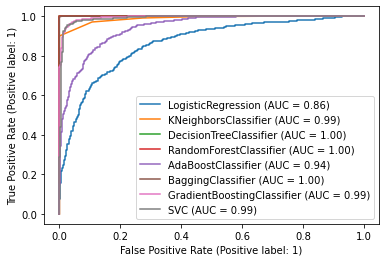

In [79]:
plt.figure(figsize=(8,8))

curve = plot_roc_curve(log_reg,x_train,y_train)

plot_roc_curve(knn,x_train,y_train,ax=curve.ax_)

plot_roc_curve(dt_model,x_train,y_train,ax=curve.ax_)

plot_roc_curve(forest,x_train,y_train,ax=curve.ax_)

plot_roc_curve(ada_boost,x_train,y_train,ax=curve.ax_)

plot_roc_curve(bagging,x_train,y_train,ax=curve.ax_)

plot_roc_curve(gr_boost,x_train,y_train,ax=curve.ax_)

plot_roc_curve(svm,x_train,y_train,ax=curve.ax_)

plt.legend(loc='lower right')

plt.show()

<Figure size 576x576 with 0 Axes>

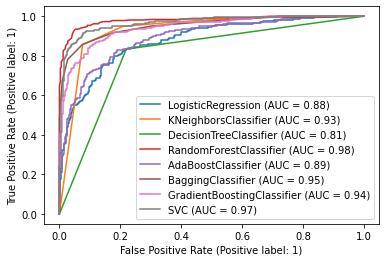

In [80]:
plt.figure(figsize=(8,8))

curve = plot_roc_curve(log_reg,x_test,y_test)

plot_roc_curve(knn,x_test,y_test,ax=curve.ax_)

plot_roc_curve(dt_model,x_test,y_test,ax=curve.ax_)

plot_roc_curve(forest,x_test,y_test,ax=curve.ax_)

plot_roc_curve(ada_boost,x_test,y_test,ax=curve.ax_)

plot_roc_curve(bagging,x_test,y_test,ax=curve.ax_)

plot_roc_curve(gr_boost,x_test,y_test,ax=curve.ax_)

plot_roc_curve(svm,x_test,y_test,ax=curve.ax_)

plt.legend(loc='lower right')

plt.show()

## Hyper Parameter Tunning

In [81]:
from sklearn.model_selection import GridSearchCV

In [82]:

parameters = {"n_estimators":[70,80,90,100,110],
             "criterion":["gini", "entropy"],
             "max_depth":[10,12,14,16,30,None],
             "max_features":["sqrt", "log2"]}

In [83]:
grid_CV = GridSearchCV(estimator=forest,param_grid=parameters,n_jobs=-1)

In [84]:
grid_CV.fit(x_train,y_train)

GridSearchCV(estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 12, 14, 16, 30, None],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [70, 80, 90, 100, 110]})

In [85]:
grid_CV.best_params_

{'criterion': 'entropy',
 'max_depth': 16,
 'max_features': 'sqrt',
 'n_estimators': 100}

## Final Model

In [86]:
forest_tunned = RandomForestClassifier(criterion='gini',max_depth=30,max_features='log2',n_estimators=100,n_jobs=-1)

In [87]:
model_build(forest_tunned)

Model report
train score
Accuracy Score: 1.0


Test score
Accuracy Score: 0.9510791366906475


Confusion matrix: 
 [[319   9]
 [ 25 342]]


classification Report 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95       328
           1       0.97      0.93      0.95       367

    accuracy                           0.95       695
   macro avg       0.95      0.95      0.95       695
weighted avg       0.95      0.95      0.95       695



<Figure size 576x576 with 0 Axes>

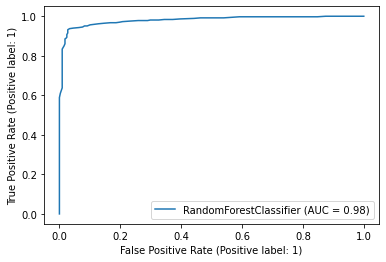

In [88]:
plt.figure(figsize=(8,8))

curve = plot_roc_curve(forest_tunned,x_test,y_test)

plt.legend(loc='lower right')

plt.show()

## Model Saving

In [89]:
import joblib

In [90]:
joblib.dump(forest_tunned,'IBM_HR_Analytics_Final_model.pkl')

['IBM_HR_Analytics_Final_model.pkl']